In [14]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
from pathlib import Path

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from energySystem import System, NaturalGasBoiler, HeatPump, Battery, ThermalStorage, PVsystem, Windsystem, ElectricBoiler
import layouts.default_values as DEFAULT

In [16]:
sns.set_context(context="notebook")
plt.rcParams["figure.dpi"] = 300
path = Path('.') / "layouts"

!!!! made LMPs higher than sell back price to have a DCP compliant problem (we are not able to make money by selling back to the grid)

## Import data

In [17]:
def get_demand_mask_and_price(df, colName, dt):
    col = df[colName].to_numpy() / dt
    mask = col > 0
    price = col[mask][0]
    return mask, price

In [18]:
##### loads
df = pd.read_csv(path / "loads" / "site1_load.csv")
dt = 1/4 # in hours
powerLoad, heatLoad = df['Power Load [kWh]'].to_numpy(), df['Heat Load [kWh]'].to_numpy()

##### prices
df = pd.read_csv(path / "power_grid" / "direct_access.csv")
energyPricePower = df["energyPrice"].to_numpy() # $/kWh
sellBackPrice = np.full(len(energyPricePower), DEFAULT.SELL_BACK_PRICE) # $/kWh
# from per kW to per kWh in 15 minutes
powerDemandFee = [get_demand_mask_and_price(df, colName, dt) for colName in ["peakDemandSummerPrice",
                                                                          "partialPeakDemandSummerPrice",
                                                                          "demandSummerPrice",
                                                                          "peakDemandWinterPrice",
                                                                          "demandWinterPrice"]]
df = pd.read_csv(path / "gas" / "gas_price.csv")
energyPriceGas = df["energyPrice"].to_numpy() # $/kWh

##### emissions
df = pd.read_csv(path / "power_grid" / "power_grid_emissions.csv")
df.ffill(inplace=True)
emissionsPower = df["MOER version 2.0"].to_numpy() # kCO2eq/KWhe
df = pd.read_csv(path / "gas" / "gas_emissions.csv")
emissionsGas = df["gasEmissions"].to_numpy() # kCO2eq/kWhgas

##### pv load
df = pd.read_csv(path / "renewable_loadprofiles" / "utility_scale_solar.csv")
pvuLoad = df["0"].to_numpy()

##### wind load
df = pd.read_csv(path / "renewable_loadprofiles" / "wind.csv")
windLoad = df["feedin_power_plant"].to_numpy()

##### time index
timeIndex = pd.date_range(start='1/1/2023', periods=len(powerLoad), freq='15min')

# clear memory
del df

In [19]:
# number of timesteps
n_timesteps = len(powerLoad)

## Natural Gas Only

In [20]:
system1 = System(
    "baseline",
    timeIndex=timeIndex,
    powerLoad=powerLoad,
    heatLoad=heatLoad,
    powerPrice=energyPricePower,
    sellBackPrice=sellBackPrice,
    powerDemandFee=powerDemandFee,
    gasPrice=energyPriceGas,
    gridMarginalEmissions=emissionsPower,
    gasMarginalEmissions=emissionsGas
)
ngf1 = NaturalGasBoiler(
    n_timesteps=n_timesteps,
    dt=1/4,
    eff=DEFAULT.GAS_BOILER_EFF,
    capacityPrice=DEFAULT.GAS_BOILER_CAPA_PRICE,
    discRate=DEFAULT.DISCOUNT_RATE,
    n_years=DEFAULT.GAS_BOILER_LIFETIME)
system1.addComponent(ngf1)
system1.solve(objective="cost", solver="MOSEK")
system1.describe()


System: baseline
Components:
NaturalGasBoiler
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 10000.0 MWh | net power 10000.0 MWh | gas 30887.0 MWh
Annual cost : 2.637 M$
Annual operational emissions : 10.81 MtonCO2
LCOE (Energy) : 0.067 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.275 kgCO2/kWh of final energy consumption


A sanity check: max capa of the gas furnace should be max(heatLoad)/dt

In [21]:
print(f"The difference is {heatLoad.max()/dt - ngf1._variables[1].value} kW.")

The difference is 0.0 kW.


In [22]:
baselineEmissions = system1.totalEmissions.value
baselineCost = system1.totalCost.value

## Natural Gas and Heat Pump

In [24]:
hp1 = HeatPump(
    n_timesteps=n_timesteps,
    dt=1/4,
    COP=DEFAULT.HP_COP,
    ramp_rate=DEFAULT.HP_RAMP_RATE,
    capacityPrice=DEFAULT.HP_CAPA_PRICE,
    discRate=DEFAULT.DISCOUNT_RATE,
    n_years=DEFAULT.HP_LIFETIME
)
system1.addComponent(hp1)
system1.solve(objective="cost", emissionsCap=0.8*baselineEmissions, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 16730.0 MWh | net power 16730.0 MWh | gas 4675.0 MWh
Annual cost : 2.131 M$
Annual operational emissions : 7.21 MtonCO2
LCOE (Energy) : 0.054 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.183 kgCO2/kWh of final energy consumption


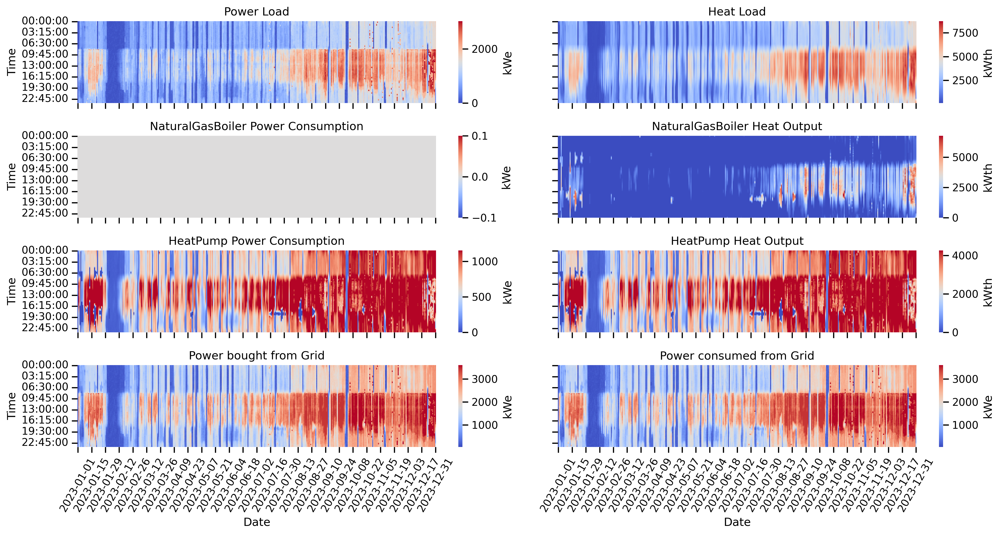

In [25]:
system1.plotHeatmaps();

## Natural Gas and Heat Pump and Battery

In [26]:
lion1 = Battery(
    n_timesteps=n_timesteps,
    dt=1/4,
    capacityPrice=DEFAULT.LION_CAPA_PRICE,
    maxChargeRate=DEFAULT.LION_MAX_CHARGE_RATE,
    effCharge=DEFAULT.LION_EFF_CHARGE,
    effDischarge=DEFAULT.LION_EFF_DISCHARGE,
    discRate=DEFAULT.DISCOUNT_RATE,
    n_years=DEFAULT.LION_LIFETIME,
    name="Lithium Ion Battery"
)
system1.addComponent(lion1)
system1.solve(objective="cost", emissionsCap=0.7*baselineEmissions, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 16891.0 MWh | net power 16891.0 MWh | gas 4592.0 MWh
Annual cost : 2.125 M$
Annual operational emissions : 7.14 MtonCO2
LCOE (Energy) : 0.054 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.182 kgCO2/kWh of final energy consumption


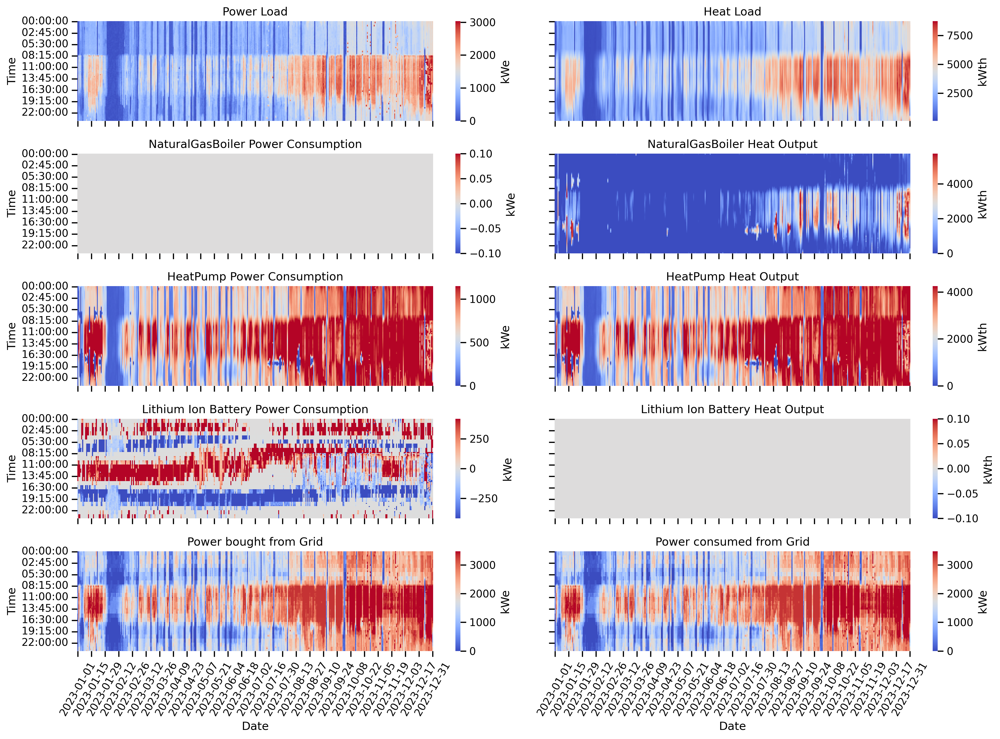

In [27]:
system1.plotHeatmaps();

In [28]:
print(f"number of cycles : {np.round(lion1._variablesDict['cycles'].value)}.")

number of cycles : 449.0.


## Natural Gas and Heat Pump and Battery and Thermal Energy Storage

In [29]:
tes1 = ThermalStorage(
    n_timesteps=n_timesteps,
    dt=1/4,
    energyCapacityPrice=DEFAULT.TES_ECAPA_PRICE,
    powerCapacityPrice=DEFAULT.TES_PCAPA_PRICE,
    lossRate=DEFAULT.TES_LOSS_RATE,
    effCharge=DEFAULT.TES_EFF_CHARGE,
    effDischarge=DEFAULT.TES_EFF_DISCHARGE,
    discRate=DEFAULT.DISCOUNT_RATE,
    n_years=DEFAULT.TES_LIFETIME
)
system1.addComponent(tes1)
system1.solve(objective="cost", emissionsCap=0.6*baselineEmissions, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery | ThermalStorage
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 17863.0 MWh | net power 17863.0 MWh | gas 1326.0 MWh
Annual cost : 2.169 M$
Annual operational emissions : 6.48 MtonCO2
LCOE (Energy) : 0.055 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.165 kgCO2/kWh of final energy consumption


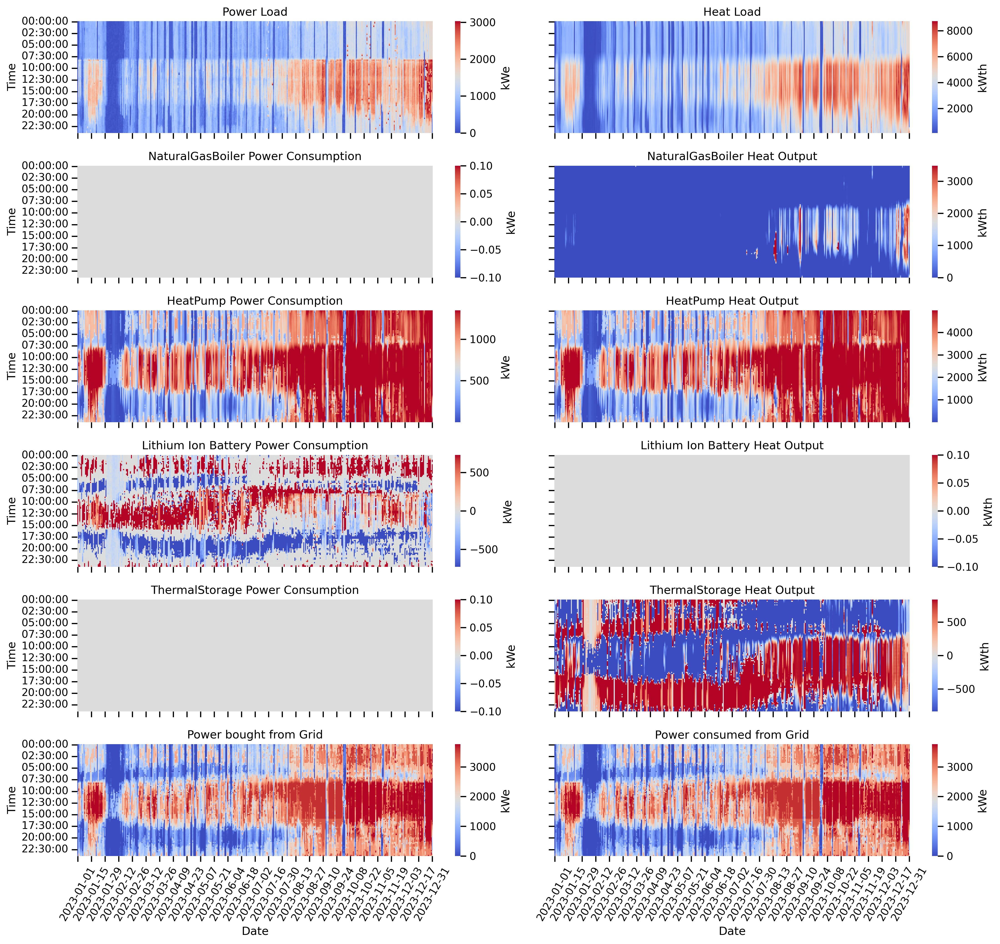

In [30]:
system1.plotHeatmaps();

In [31]:
print(f"number of cycles : {np.round(lion1._variablesDict['cycles'].value)}.")

number of cycles : 429.0.


## Natural Gas and Heat Pump and Battery and Thermal Energy Storage and offsite PV

In [32]:
pvu1 = PVsystem(
    n_timesteps=n_timesteps,
    dt=1/4,
    pvLoadProfile=pvuLoad,
    ppaPrice=DEFAULT.PV_OFFSITE_PPA_PRICE,
    onsite=False
)
system1.addComponent(pvu1)
system1.solve(objective="cost", emissionsCap=0.5*baselineEmissions, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery | ThermalStorage | PVsystem
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 17219.0 MWh | net power 11241.0 MWh | gas 3365.0 MWh
Annual cost : 2.122 M$
Annual operational emissions : 5.4 MtonCO2
LCOE (Energy) : 0.054 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.137 kgCO2/kWh of final energy consumption


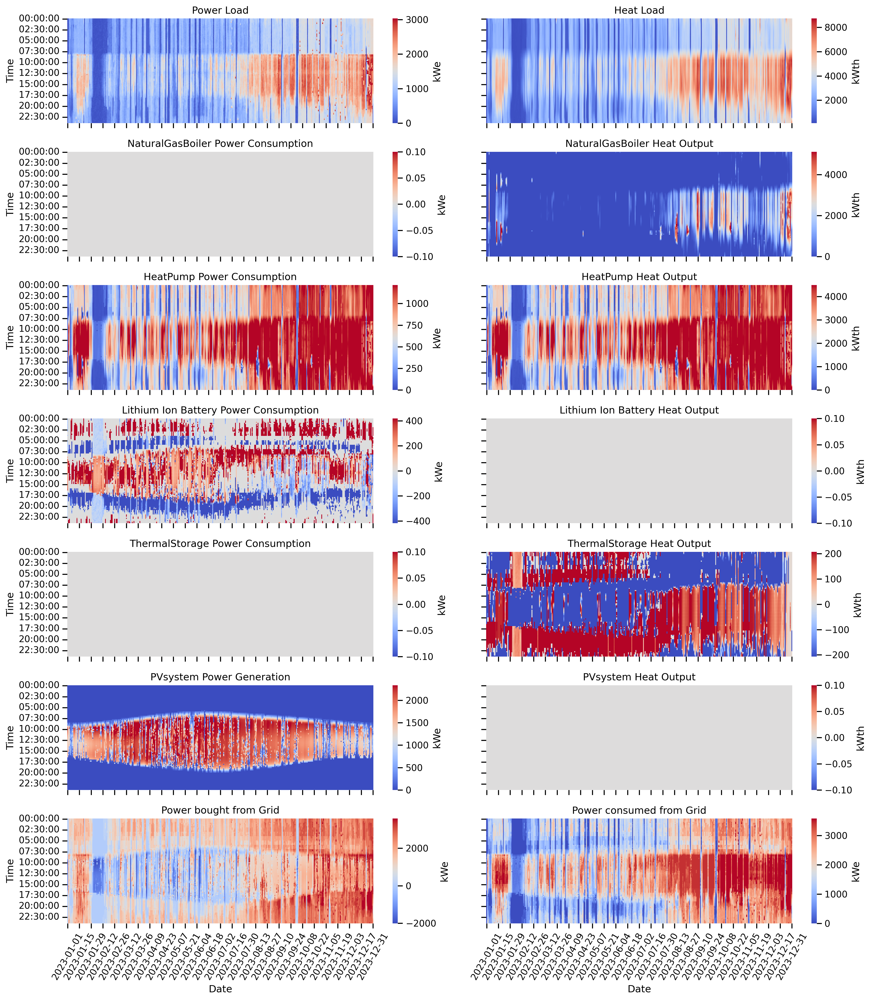

In [33]:
system1.plotHeatmaps();

In [34]:
print(f"number of cycles : {np.round(lion1._variablesDict['cycles'].value)}.")

number of cycles : 453.0.


## Natural Gas and Heat Pump and Battery and Thermal Energy Storage and offsite PV and wind

In [35]:
wind1 = Windsystem(
    n_timesteps=n_timesteps,
    dt=1/4,
    WindLoadProfile=windLoad,
    ppaPrice=DEFAULT.WIND_OFFSITE_PPA_PRICE,
    onsite=False
)
system1.addComponent(wind1)
system1.solve(objective="cost", emissionsCap=0.5*baselineEmissions, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery | ThermalStorage | PVsystem | Windsystem
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 16889.0 MWh | net power 8462.0 MWh | gas 4467.0 MWh
Annual cost : 1.988 M$
Annual operational emissions : 4.67 MtonCO2
LCOE (Energy) : 0.051 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.119 kgCO2/kWh of final energy consumption


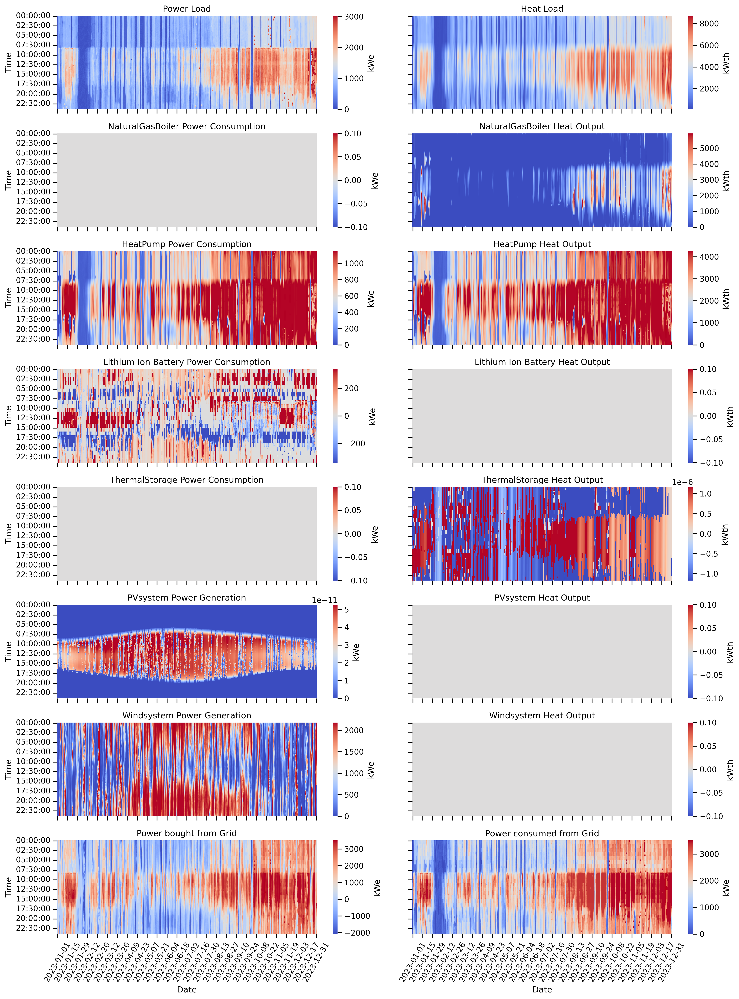

In [36]:
system1.plotHeatmaps();

In [37]:
print(f"number of cycles : {np.round(lion1._variablesDict['cycles'].value)}.")

number of cycles : 419.0.


## Natural Gas and Heat Pump and Battery and Thermal Energy Storage and offsite PV and wind and electric boiler

In [38]:
elecboil1 = ElectricBoiler(
    n_timesteps=n_timesteps,
    dt=1/4,
    eff=DEFAULT.ELECTRIC_BOILER_EFF,
    capacityPrice=DEFAULT.ELECTRIC_BOILER_CAPA_PRICE,
    discRate=DEFAULT.DISCOUNT_RATE,
    n_years=DEFAULT.ELECTRIC_BOILER_LIFETIME
)
system1.addComponent(elecboil1)
system1.solve(objective="cost", solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery | ThermalStorage | PVsystem | Windsystem | ElectricBoiler
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 16890.0 MWh | net power 8462.0 MWh | gas 4466.0 MWh
Annual cost : 1.988 M$
Annual operational emissions : 4.67 MtonCO2
LCOE (Energy) : 0.051 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.119 kgCO2/kWh of final energy consumption


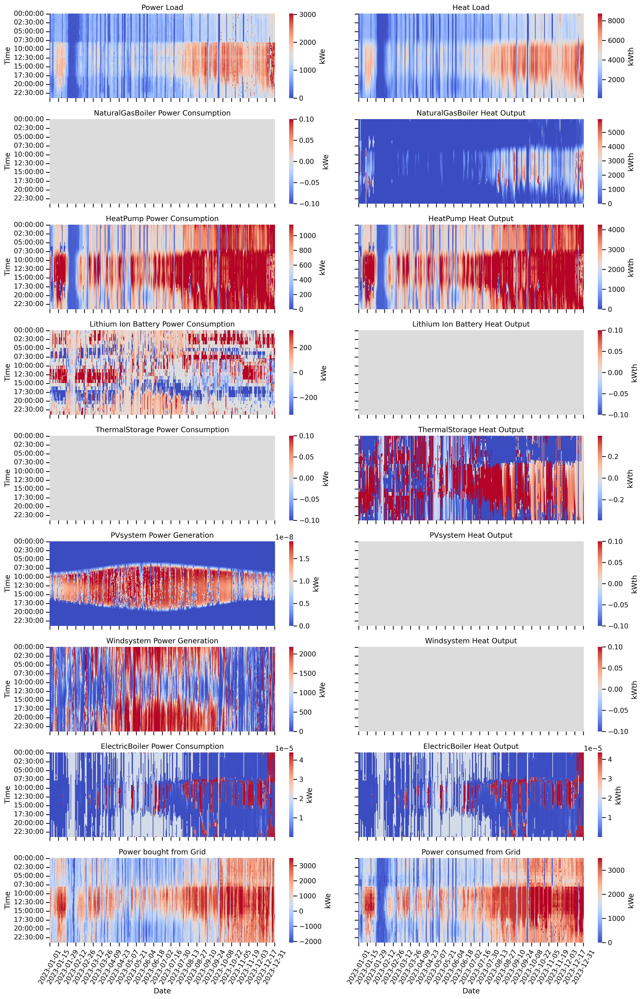

In [39]:
system1.plotHeatmaps();

In [40]:
print(f"number of cycles : {np.round(lion1._variablesDict['cycles'].value)}.")

number of cycles : 419.0.


In [41]:
colors = {'HeatPump': 'C0', 'Power Load': 'C7', 'Lithium Ion Battery': 'C4', 'Total Power Consumption': 'black', 'PVsystem': 'C1', 'Windsystem':'C2', '':'C4',
          'NaturalGasBoiler' : 'C5', 'ElectricBoiler': 'C6', 'Heat Load': 'C3', 'ThermalStorage': 'C4', 'Total Heat Consumption': 'black',
          'Marginal Power Price': 'C3', 'Marginal Power Emissions': 'C5'}

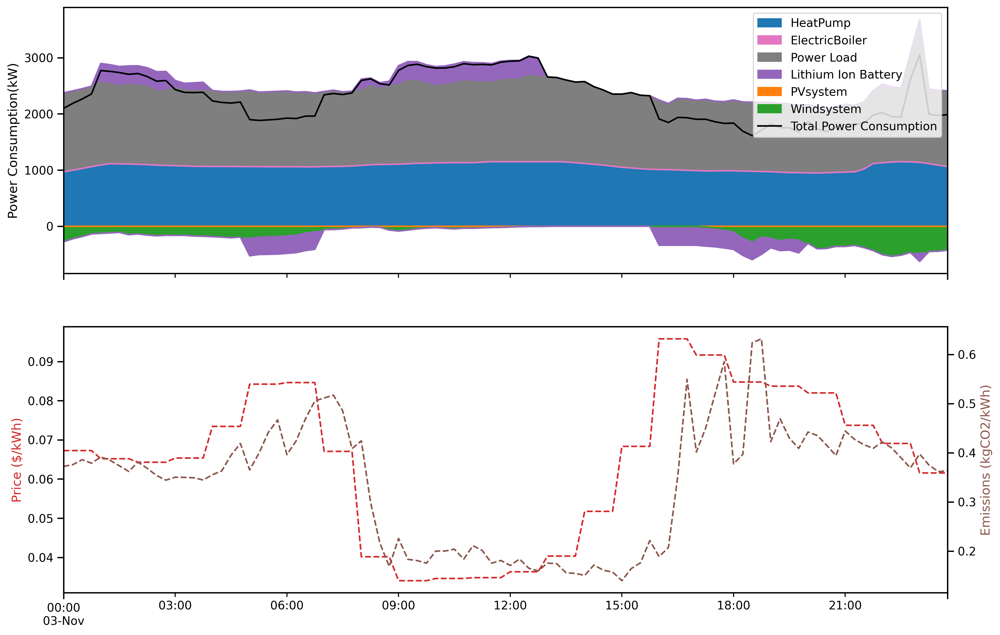

In [42]:
powerConsumers = ['HeatPump', 'ElectricBoiler', 'Power Load']
powerStorage = ['Lithium Ion Battery']
powerGenerators = ['PVsystem', 'Windsystem']
system1.plot_power(colors, powerConsumers, powerStorage, powerGenerators, '2023-11-03');

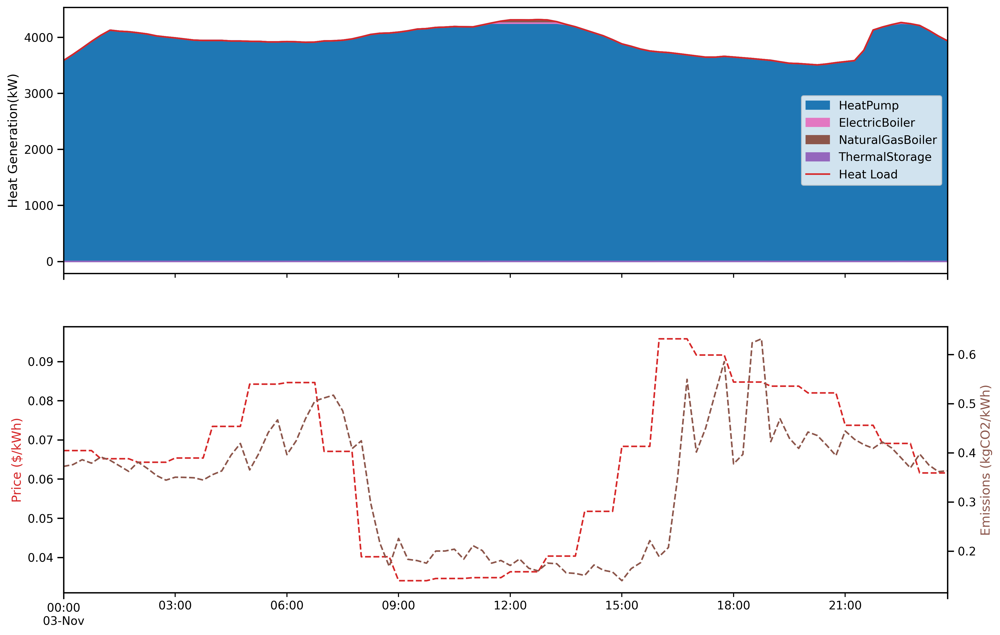

In [43]:
heatGenerators = ['HeatPump', 'ElectricBoiler', 'NaturalGasBoiler', ]
heatStorage = ['ThermalStorage']
test = system1.plot_heat(colors, heatGenerators, heatStorage, '2023-11-03')

### If we want to minimize emissions ?

In [44]:
system1.solve(objective="emissions", costCap=baselineCost, solver="MOSEK")
system1.describe()

System: baseline
Components:
NaturalGasBoiler | HeatPump | Lithium Ion Battery | ThermalStorage | PVsystem | Windsystem | ElectricBoiler
Annual loads : power 10000.0 MWh | heat 29343.0 MWh
Annual consumptions : power 18292.0 MWh | net power -12264.0 MWh | gas 43.0 MWh
Annual cost : 2.637 M$
Annual operational emissions : 1.29 MtonCO2
LCOE (Energy) : 0.067 $/kWh of final energy consumption
Carbon Intensity of Energy : 0.033 kgCO2/kWh of final energy consumption


In [45]:
print(f"Total emissions: {np.round(100*system1.totalEmissions.value/baselineEmissions, 2)} % of baseline emissions.")
print(f"Total cost: {np.round(100*system1.totalCost.value/baselineCost, 2)} % of baseline cost.")

Total emissions: 11.94 % of baseline emissions.
Total cost: 100.0 % of baseline cost.


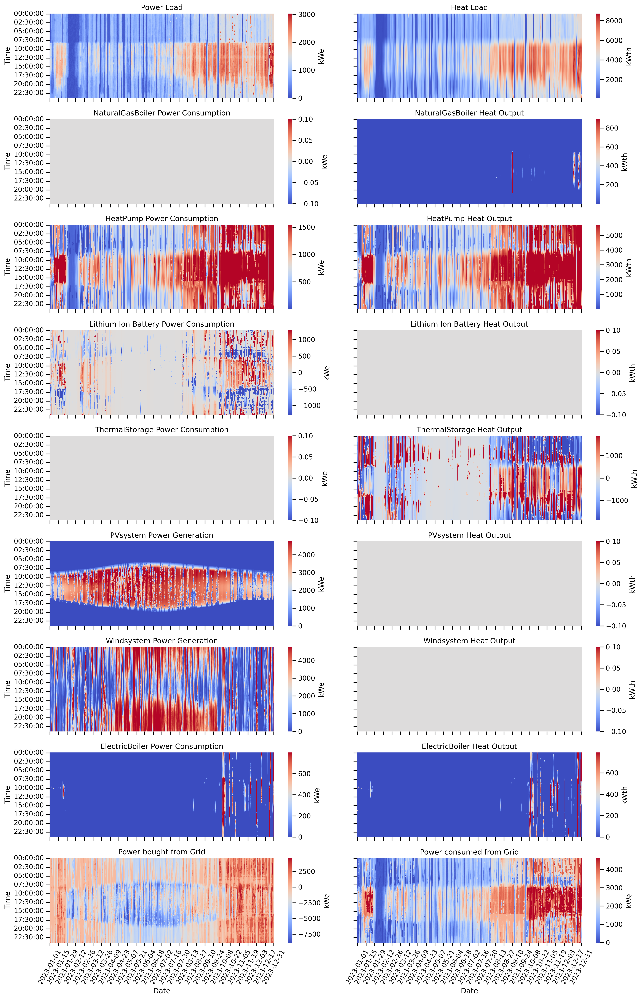

In [51]:
system1.plotHeatmaps();

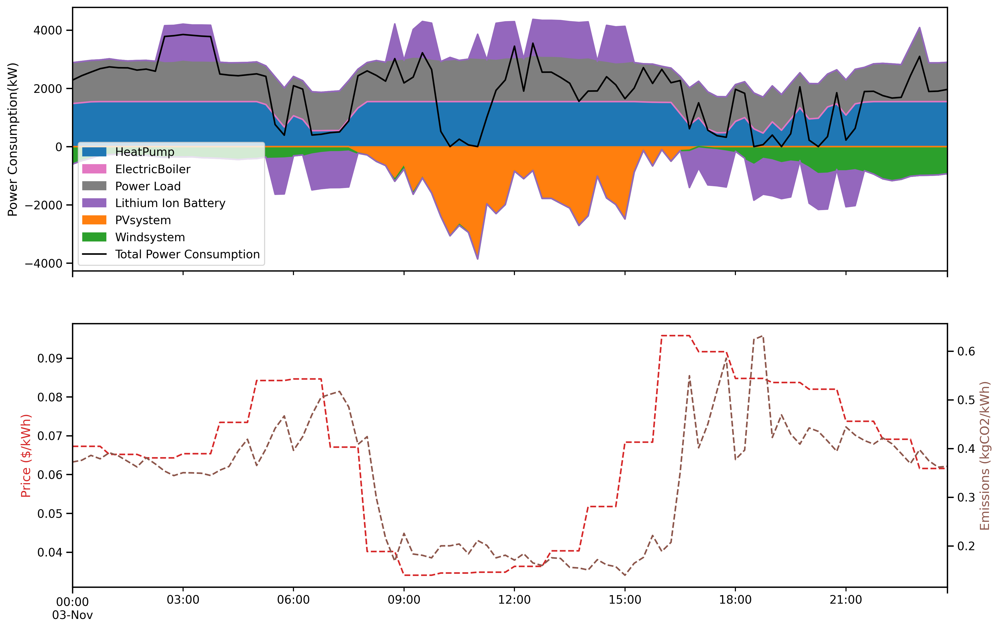

In [47]:
powerConsumers = ['HeatPump', 'ElectricBoiler', 'Power Load']
powerStorage = ['Lithium Ion Battery']
powerGenerators = ['PVsystem', 'Windsystem']
system1.plot_power(colors, powerConsumers, powerStorage, powerGenerators, '2023-11-03');

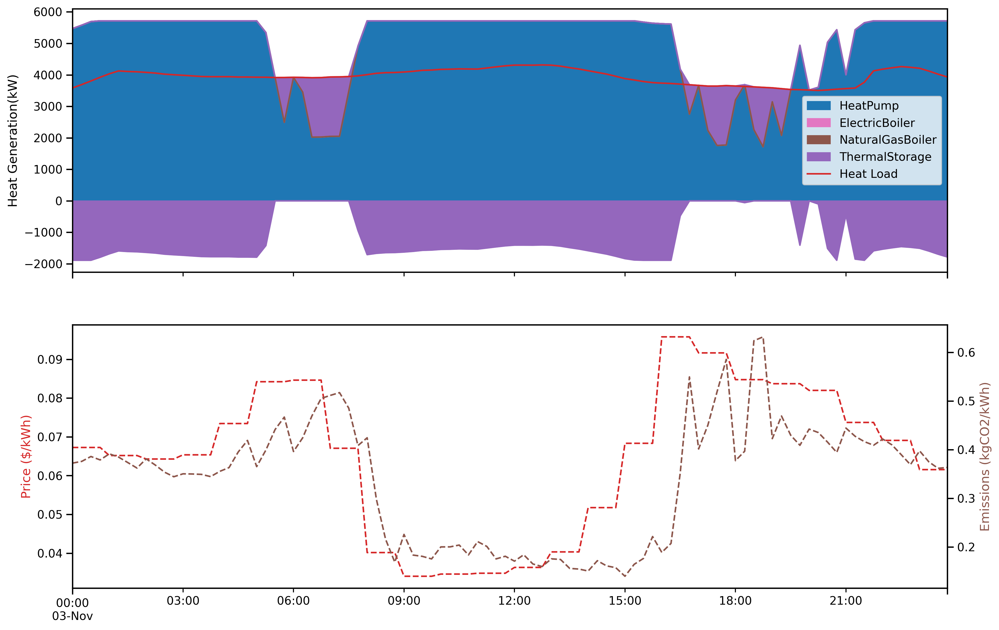

In [52]:
heatGenerators = ['HeatPump', 'ElectricBoiler', 'NaturalGasBoiler', ]
heatStorage = ['ThermalStorage']
test = system1.plot_heat(colors, heatGenerators, heatStorage, '2023-11-03')